In [1]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
print("Num GPUs:", len(physical_devices))
tf.config.set_visible_devices(physical_devices[2], 'GPU')

from keras.callbacks import ModelCheckpoint
from keras.callbacks import LearningRateScheduler
import keras.backend as K
from keras.optimizers import Adam
from keras.utils import to_categorical

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import albumentations as A
import random

from deep_globe_segmentation import models, dataset_utils as dataset, plot_utils as plt

2024-01-16 16:43:07.713676: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-16 16:43:08.232547: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/buu3clj/radar_ws/tf211-env/lib/
2024-01-16 16:43:08.232591: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/buu3clj/radar_ws/tf211-env/lib/
2024-01-16 16:43:08.232596: W tensorflow/compiler/tf2t

Num GPUs: 4


In [2]:
input_folder = '/home/buu3clj/radar_ws/deep_globe_segmentation/dataset/cropped_dataset'
weights_path_resnet50 = '/home/buu3clj/radar_ws/deep_globe_segmentation/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
weights_path_inception_resnet_v2 = '/home/buu3clj/radar_ws/deep_globe_segmentation/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5'
output_folder = '/home/buu3clj/radar_ws/deep_globe_segmentation/models'

In [3]:
image_files = [filename for filename in os.listdir(input_folder) if filename.endswith('.jpg')]
mask_files = [filename for filename in os.listdir(input_folder) if filename.endswith('.png')]

image_files.sort()
mask_files.sort()

combined = list(zip(image_files, mask_files))
random.shuffle(combined)
image_files[:], mask_files[:] = zip(*combined)

image_files_train, image_files_val, mask_files_train, mask_files_val = train_test_split(
    image_files, mask_files, test_size=0.3, random_state=42, shuffle=True)

In [4]:
num_classes = 7
colors = [
    [0, 255, 255],   # urban_land
    [255, 255, 0],   # agriculture_land
    [255, 0, 255],   # rangeland
    [0, 255, 0],     # forest_land
    [0, 0, 255],     # water
    [255, 255, 255], # barren_land
    [0, 0, 0]        # unknown
]
class_names = [
    "Urban Land",
    "Agriculture Land",
    "Rangeland",
    "Forest Land",
    "Water",
    "Barren Land",
    "Unknown"
]

In [5]:
class_weights = dataset.calculate_class_weights(mask_files, colors, input_folder)
class_weights[6] = 1 # Unknown weight should be 1
print("Class Weights:", class_weights),

Class Weights: {0: 1.3908685526065514, 1: 0.24779873855539716, 2: 1.581703045618714, 3: 1.3963168001957018, 4: 4.013703206270928, 5: 1.5568543438690847, 6: 1}


(None,)

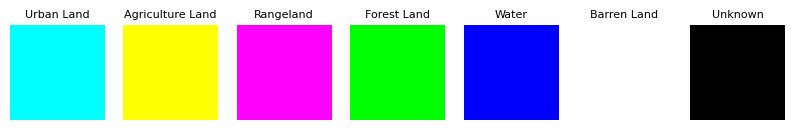

In [6]:
plt.display_color_classes(colors, class_names)

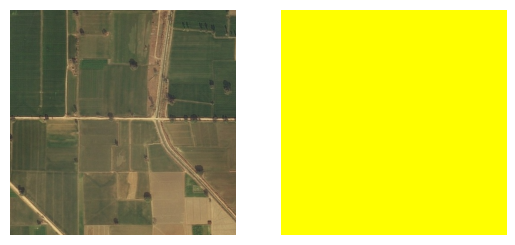

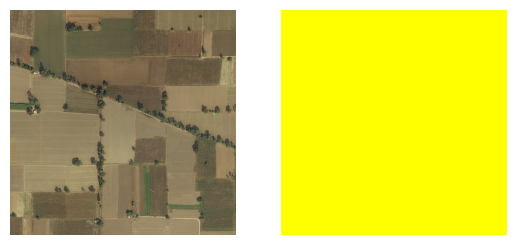

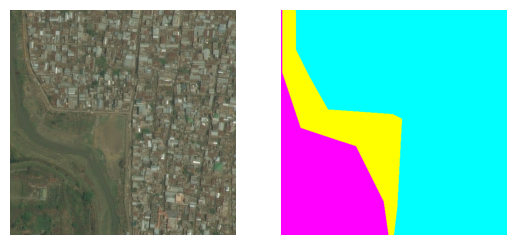

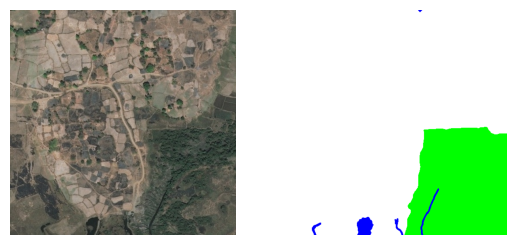

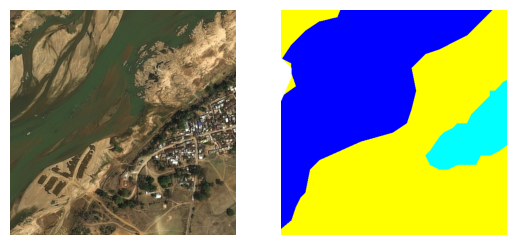

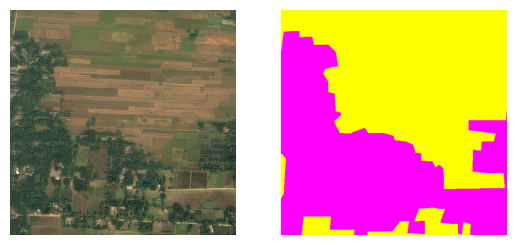

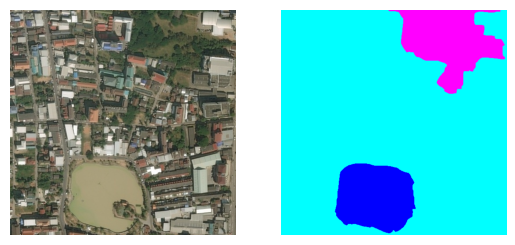

In [7]:
plt.plot_images_and_masks(input_folder, image_files_train[:7], mask_files_train[:7], load=True)

In [8]:
spatial_augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
])

color_augmentation = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=15, p=0.5),
])

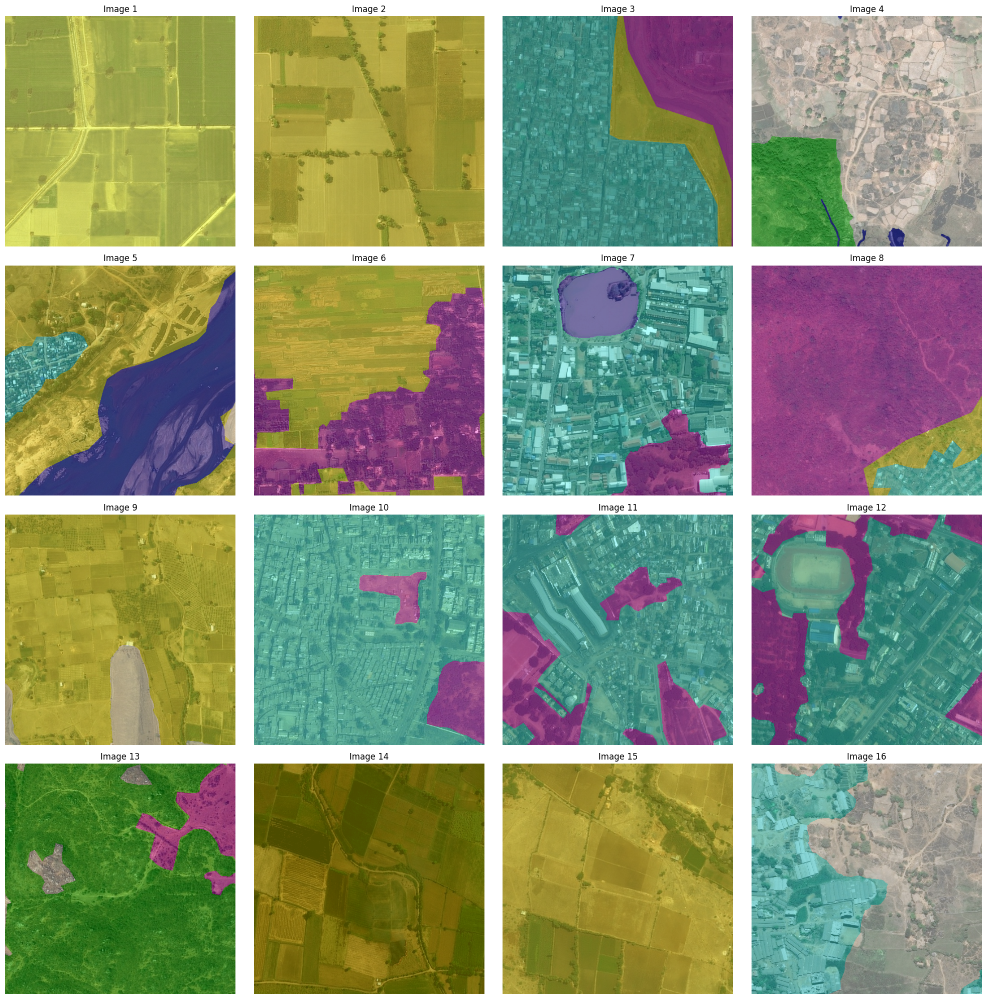

In [9]:
data_gen = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, 16, num_classes, spatial_augmentation, color_augmentation)
images, masks = next(data_gen)

plt.plot_images_with_overlaid_masks(images, masks, colors)

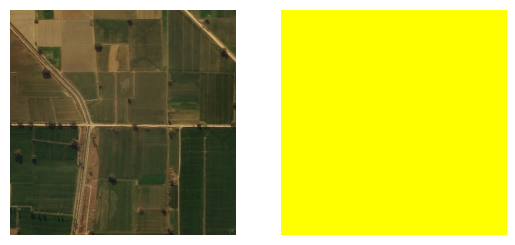

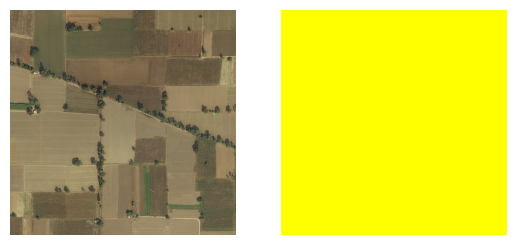

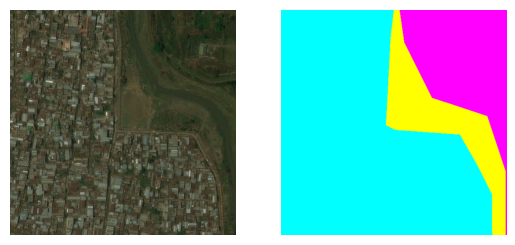

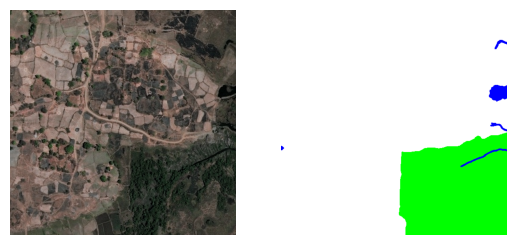

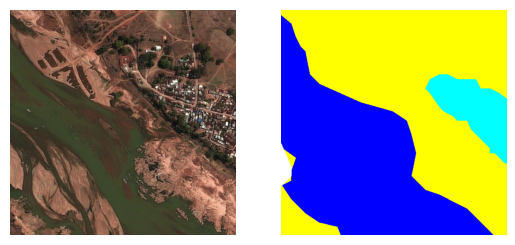

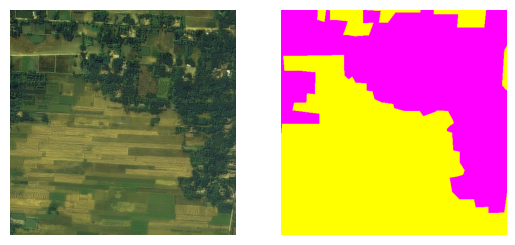

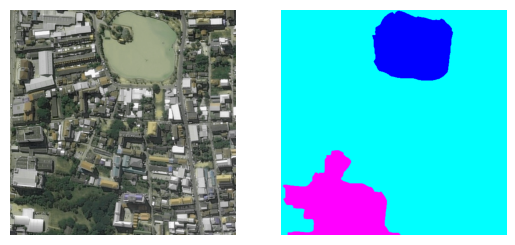

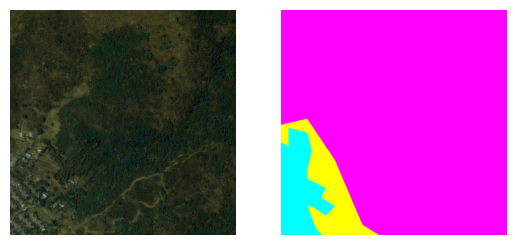

In [10]:
data_gen = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, 8, num_classes, spatial_augmentation, color_augmentation)
images, masks = next(data_gen)
masks = [dataset.one_hot_to_rgb(mask, colors) for mask in masks]
plt.plot_images_and_masks(input_folder, images, masks)

In [11]:
# model = models.build_inception_resnetv2_unet((512,512,3), num_classes, weights_path_inception_resnet_v2)
model = models.build_resnet50_unet_v2((512,512,3), num_classes, weights_path_resnet50)

model.compile(optimizer=Adam(learning_rate=0.00005), loss=models.weighted_dice_loss(class_weights), metrics=['accuracy'])
# model.compile(optimizer=Adam(slearning_rate=0.00005), loss=models.dice_loss, metrics=['accuracy'])

print(model.summary())

2024-01-16 16:44:22.739274: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-16 16:44:22.743949: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-16 16:44:22.745026: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-16 16:44:22.746006: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

Model: "ResNet50-UNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 518, 518, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 256, 256, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                      

In [12]:
def scheduler(epoch, lr):
    if epoch < 3:
        return lr
    else:
        return lr * 0.85

lr_scheduler = LearningRateScheduler(scheduler)

checkpoint = ModelCheckpoint(
    os.path.join(output_folder, 'best_model_resnet50.h5'),
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [13]:
batch_size = 8

data_gen_train = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, batch_size, num_classes, spatial_augmentation, color_augmentation)
data_gen_val = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

history = model.fit(
    data_gen_train,
    validation_data=data_gen_val,
    epochs=20,
    steps_per_epoch=len(image_files_train) // batch_size,
    validation_steps=len(image_files_val) // batch_size,
    callbacks=[lr_scheduler, checkpoint]
)

Epoch 1/20


2024-01-16 16:44:27.979814: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inResNet50-UNet/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-01-16 16:44:29.015346: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2024-01-16 16:44:29.990868: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


137/137 [==============================] - ETA: 0s - loss: 1.3064 - accuracy: 0.3139
Epoch 1: val_loss improved from inf to 1.55852, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_resnet50.h5
137/137 [==============================] - 131s 880ms/step - loss: 1.3064 - accuracy: 0.3139 - val_loss: 1.5585 - val_accuracy: 0.0383 - lr: 5.0000e-05
Epoch 2/20
137/137 [==============================] - ETA: 0s - loss: 1.1269 - accuracy: 0.4949
Epoch 2: val_loss improved from 1.55852 to 1.55846, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_resnet50.h5
137/137 [==============================] - 123s 875ms/step - loss: 1.1269 - accuracy: 0.4949 - val_loss: 1.5585 - val_accuracy: 0.0383 - lr: 5.0000e-05
Epoch 3/20
137/137 [==============================] - ETA: 0s - loss: 1.0464 - accuracy: 0.5475
Epoch 3: val_loss improved from 1.55846 to 1.55796, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_

In [14]:
with tf.keras.utils.custom_object_scope({'dice_loss': models.dice_loss, 'weighted_dice_loss': models.weighted_dice_loss(class_weights)}):
    model = tf.keras.models.load_model(os.path.join(output_folder, 'best_model_resnet50.h5'))

Overall Classification Report:


/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

      Urban Land       0.87      0.86      0.87  13390369
Agriculture Land       0.94      0.56      0.71  71415171
       Rangeland       0.18      0.63      0.28  10195414
     Forest Land       0.77      0.84      0.80  11590645
           Water       0.94      0.86      0.90   4737900
     Barren Land       0.63      0.80      0.71  12390662
         Unknown       0.00      0.00      0.00     11807

        accuracy                           0.66 123731968
       macro avg       0.62      0.65      0.61 123731968
    weighted avg       0.83      0.66      0.71 123731968

Overall Confusion Matrix:
[[11573967   269424  1002738   129903    13615   400722        0]
 [  816331 40242795 24646583  1682259   108639  3918564        0]
 [  550787  1240447  6438403   936535    88515   940727        0]
 [   18684   210318  1229427  9729094    29509   373613        0]
 [   12752   161319   354411    11351  4076278   121789        0]
 [ 

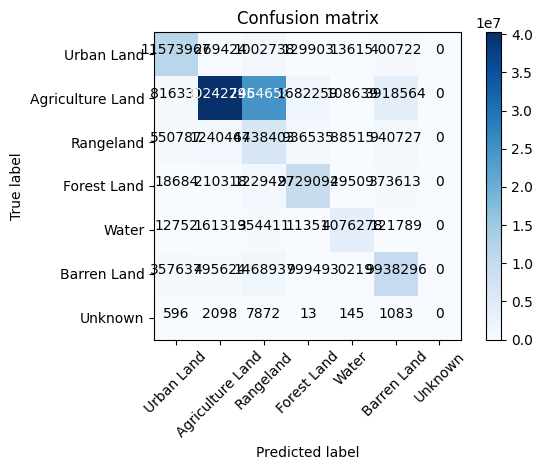

In [15]:
batch_size = 8
test_gen = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

all_true_labels = []
all_pred_labels = []

num_batches = len(image_files_val) // batch_size

for i, (images, true_masks) in enumerate(test_gen):
    if i >= num_batches:
        break

    pred_masks = model.predict(images, verbose=0)

    true_labels = np.argmax(true_masks, axis=-1).flatten()
    pred_labels = np.argmax(pred_masks, axis=-1).flatten()

    all_true_labels.append(true_labels)
    all_pred_labels.append(pred_labels)

y_true = np.concatenate(all_true_labels)
y_pred = np.concatenate(all_pred_labels)

print("Overall Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred, labels=range(num_classes))
print("Overall Confusion Matrix:")
print(cm)
plt.plot_confusion_matrix(cm, classes=class_names)

Class-wise Metrics:


/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

      Urban Land       0.87      0.86      0.87  13390369
Agriculture Land       0.94      0.56      0.71  71415171
       Rangeland       0.18      0.63      0.28  10195414
     Forest Land       0.77      0.84      0.80  11590645
           Water       0.94      0.86      0.90   4737900
     Barren Land       0.63      0.80      0.71  12390662
         Unknown       0.00      0.00      0.00     11807

        accuracy                           0.66 123731968
       macro avg       0.62      0.65      0.61 123731968
    weighted avg       0.83      0.66      0.71 123731968



/home/buu3clj/radar_ws/tf211-env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


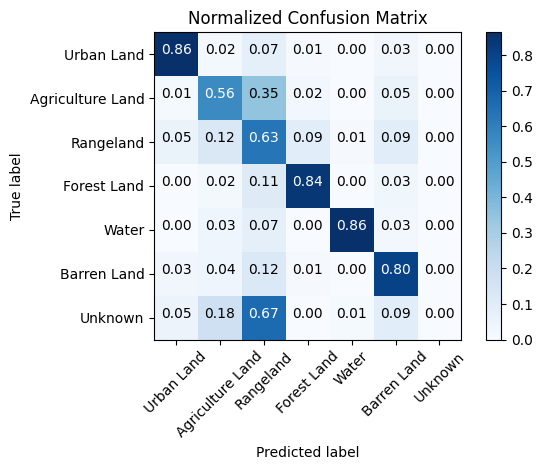

In [16]:
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.plot_confusion_matrix(cm_normalized, classes=class_names, title='Normalized Confusion Matrix')

print("Class-wise Metrics:")
print(classification_report(y_true, y_pred, target_names=class_names))

In [17]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

dice_scores = []
for i in range(num_classes):
    y_true_categorical = to_categorical(y_true, num_classes)
    y_pred_categorical = to_categorical(y_pred, num_classes)
    
    dice_score = dice_coefficient(y_true_categorical[:, i], y_pred_categorical[:, i])
    dice_scores.append(dice_score)
    print(f"Dice Coefficient for Class {class_names[i]}: {dice_score}")

Dice Coefficient for Class Urban Land: 0.8662785291671753
Dice Coefficient for Class Agriculture Land: 0.7057836651802063
Dice Coefficient for Class Rangeland: 0.2839817404747009
Dice Coefficient for Class Forest Land: 0.8047307729721069
Dice Coefficient for Class Water: 0.8973822593688965
Dice Coefficient for Class Barren Land: 0.7077183127403259
Dice Coefficient for Class Unknown: 8.468834857922047e-05


1/1 [==============================] - 6s 6s/step


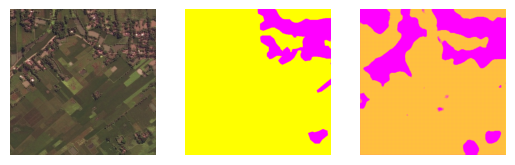

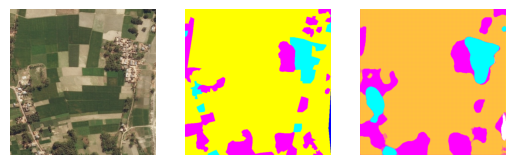

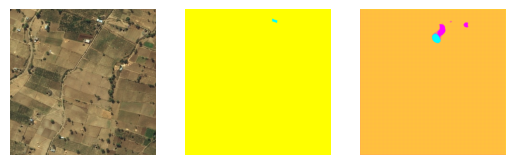

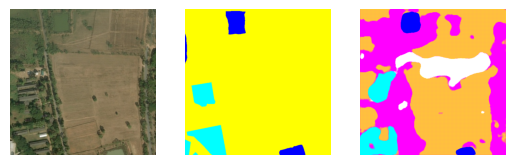

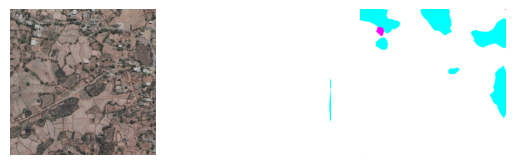

...

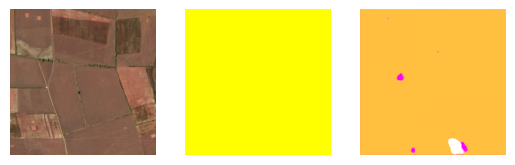

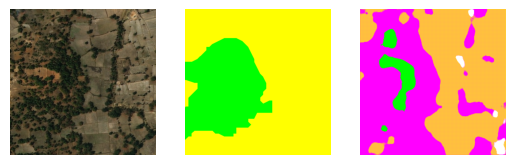

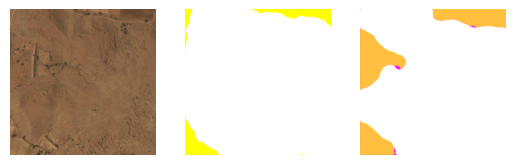

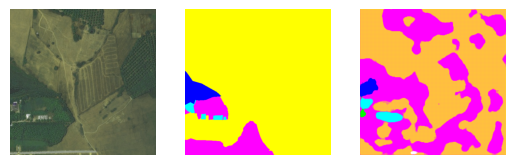

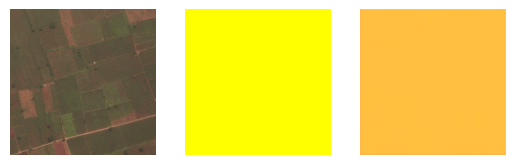

In [18]:
batch_size = 32
data_gen = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

images, masks = next(data_gen)

predicted_masks = model.predict(images)

masks = [dataset.one_hot_to_rgb(mask, colors) for mask in masks]
predicted_masks = [dataset.one_hot_to_rgb(predicted_mask, colors) for predicted_mask in predicted_masks]

plt.plot_images_and_masks(input_folder, images, masks, predicted_masks, load=False)